### Explore the Application of Diffusion Model in Video Content Creation
#### 01 - Study the Diffusion Model Step By Step
##### Haiyun Xiao  hxiao8@hawk.iit.edu
##### Yu Li  yli385@hawk.iit.edu
##### Haichen Pang - hpang3@hawk.iit.edu


#### According to the theme of the project, we conducted theoretical research on the diffusion model, the corresponding code implementation, and the completion of the final project.
1. Basics of Diffusion Model
2. Start from scratch and implement and verify the diffusion model step by step

#### 1. Basics of Diffusion Model

##### References

- classic papers

  - [《Deep Unsupervised Learning using Nonequilibrium Thermodynamics》](https://proceedings.mlr.press/v37/sohl-dickstein15.html)  2015 The Origin of Diffusion Models

  - [《Denoising Diffusion Probabilistic Models》](http://arxiv.org/abs/2006.11239)  The rise of diffusion models in 2020
  
  - [《Improved Denoising Diffusion Probabilistic Models》](https://proceedings.mlr.press/v139/nichol21a.html) Improvements to the second paper in 2021

-  Paper code
  
  - https://github.com/lucidrains/denoising-diffusion-pytorch 

  - https://github.com/openai/improved-diffusion 
 
-  Books & Websites
  - https://ayandas.me/blog-tut/2021/12/04/diffusion-prob-models.html
  - https://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_s_curve.html   Generate S-shaped 2D data points


In [2]:
# Code execution environment
# python version 3.10.5
# MPS acceleration is available on MacOS 12.3+
# conda install pytorch::pytorch torchvision torchaudio -c pytorch
# conda install -c conda-forge ipywidgets
# !pip install scikit-learn
# !pip install matplotlib
# !pip install diffusers

##### In order to better learn and understand the diffusion model, we implemented the algorithm process of DDPM through the following code

1. Generate data, a data point set of (10000, 2), forming an S-shape

shape of s: (160000, 2)


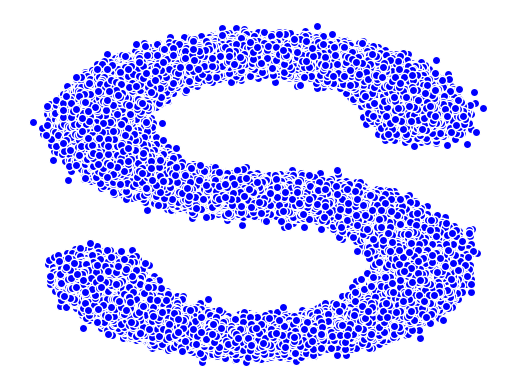

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from sklearn.datasets import make_s_curve 

import warnings
warnings.filterwarnings("ignore") 

# 20,000 data points
s_curve,_ = make_s_curve(20**4,noise=0.1) 
s_curve = s_curve[:,[0,2]]/10.0

print("shape of s:",np.shape(s_curve))

data = s_curve.T

fig,ax = plt.subplots()
ax.scatter(*data,color='blue',edgecolor='white');
ax.axis('off')

dataset = torch.Tensor(s_curve).float()

2. Determine the values of hyperparameters 

betas: $\beta$

alphas: $\alpha = 1-\beta$

alphas_prod: $\overline{\alpha_t} = \prod_{s=1}^{t}\alpha_s$

alphas_prod_p: $1 + alphas\_prod[:-1] = \overline{\alpha_{t-1}}$

alphas_bar_sqrt: $\sqrt{\overline{\alpha_t}}$

one_minus_alphas_bar_log: $log(1-\overline{\alpha_t})$

one_minus_alphas_bar_sqrt: $\sqrt{1-\overline{\alpha_t}}$

In [2]:
num_steps = 100

# Set the beta for each step 
betas = torch.linspace(-6,6,num_steps)
betas = torch.sigmoid(betas)*(0.5e-2 - 1e-5)+1e-5

# Calculate the values of alpha, alpha_prod, alpha_prod_previous, alpha_bar_sqrt and other variables 
alphas = 1-betas
alphas_prod = torch.cumprod(alphas,0)
alphas_prod_p = torch.cat([torch.tensor([1]).float(),alphas_prod[:-1]],0)
alphas_bar_sqrt = torch.sqrt(alphas_prod)
one_minus_alphas_bar_log = torch.log(1 - alphas_prod)
one_minus_alphas_bar_sqrt = torch.sqrt(1 - alphas_prod)

assert alphas.shape==alphas_prod.shape==alphas_prod_p.shape==\
alphas_bar_sqrt.shape==one_minus_alphas_bar_log.shape\
==one_minus_alphas_bar_sqrt.shape # Make sure all lists are the same length 

print("all the same shape",betas.shape)

all the same shape torch.Size([100])


3. Determine the sampling value at any time during the diffusion process $x_t = \sqrt{\overline{\alpha_t}}x_0+\sqrt{1-\overline{\alpha_t}}\epsilon$

In [3]:
# Calculate the x sample value at any time, based on x_0 and reparameterization 
def q_x(x_0,t):
    # x_0：dataset，
    # t: torch.tensor([i]),i为Sampling times
    noise = torch.randn_like(x_0)
    alphas_t = alphas_bar_sqrt[t]
    alphas_1_m_t = one_minus_alphas_bar_sqrt[t]
    return (alphas_t * x_0 + alphas_1_m_t * noise) #在x[0]的基础上添加噪声


4. Demonstrates the result after 95 steps of noise added to the original data distribution 

Call def q_x(x_0,t) multiple times to get the diffusion result each time 

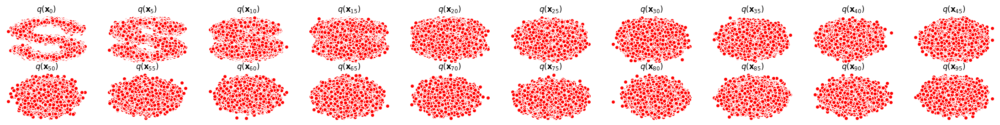

In [4]:
num_shows = 20
fig,axs = plt.subplots(2,10,figsize=(28,3))
plt.rc('text',color='black')

# There are 20,000 points in total, each point contains two coordinates 
# Generate images with noise added every 5 steps within 100 steps 
for i in range(num_shows):
    j = i//10
    k = i%10
    q_i = q_x(dataset,torch.tensor([i*num_steps//num_shows])) 
    axs[j,k].scatter(q_i[:,0],q_i[:,1],color='red',edgecolor='white')
    axs[j,k].set_axis_off()
    axs[j,k].set_title('$q(\mathbf{x}_{'+str(i*num_steps//num_shows)+'})$')

5. Write a model that fits the Gaussian distribution of the inverse diffusion process 

In [8]:
import torch
import torch.nn as nn

class MLPDiffusion(nn.Module):
    def __init__(self,n_steps,num_units=128):
        super(MLPDiffusion,self).__init__()
        
        self.linears = nn.ModuleList(
            [
                nn.Linear(2,num_units),
                nn.ReLU(),
                nn.Linear(num_units,num_units),
                nn.ReLU(),
                nn.Linear(num_units,num_units),
                nn.ReLU(),
                nn.Linear(num_units,2),
            ]
        )
        self.step_embeddings = nn.ModuleList(
            [
                nn.Embedding(n_steps,num_units),
                nn.Embedding(n_steps,num_units),
                nn.Embedding(n_steps,num_units),
            ]
        )
    def forward(self,x,t):
        #  x = x_0
        for idx,embedding_layer in enumerate(self.step_embeddings):
            t_embedding = embedding_layer(t)
            x = self.linears[2*idx](x)
            x += t_embedding
            x = self.linears[2*idx+1](x)
        x = self.linears[-1](x)
        return x


6. Write the error function for training 

model = MLPDiffusion(num_steps)

x_0: batch_x, x_0

alphas_bar_sqrt：$\sqrt{\overline{\alpha_t}}$

one_minus_alphas_bar_sqrt：$\sqrt{1-\overline{\alpha_t}}$

n_steps: num_steps = 100

loss = diffusion_loss_fn(model,x_0,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,n_steps)

In [9]:
def diffusion_loss_fn(model,x_0,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,n_steps):
    
    batch_size = x_0.shape[0]
    
    #Generate a random time t for a batchsize sample, the shape of t is torch.Size([batchsize, 1])
    t = torch.randint(0,n_steps,size=(batch_size//2,))
    t = torch.cat([t,n_steps-1-t],dim=0)
    t = t.unsqueeze(-1)
    
    # The coefficient of x0
    a = alphas_bar_sqrt[t] 
    
    # The coefficient of eps
    aml = one_minus_alphas_bar_sqrt[t] 
    
    # Generate random noise eps
    e = torch.randn_like(x_0) 
    
    x = x_0*a+e*aml 
    
    # Enter the model to get the random noise prediction value at time t
    output = model(x,t.squeeze(-1)) #t.squeeze(-1) is torch.Size([batchsize])
    # output:torch.Size([batchsize, 2])
    # Calculate the error together with the true noise and average it
    return (e - output).square().mean()

7. Writing the Inverse Diffusion Sampling Function 

Call def p_sample multiple times for reverse diffusion and save the results each time 

In [10]:
def p_sample_loop(model,shape,n_steps,betas,one_minus_alphas_bar_sqrt):
    """ reversed from x[T] to x[T-1]、x[T-2]|...x[0], x_seq include x[T]、x[T-1]、x[T-2]|...x[0]"""
    cur_x = torch.randn(shape)
    x_seq = [cur_x]
    for i in reversed(range(n_steps)):
        cur_x = p_sample(model,cur_x,i,betas,one_minus_alphas_bar_sqrt)
        x_seq.append(cur_x)
    return x_seq

$
\begin{aligned}
\tilde{\boldsymbol{\mu}}_{t} &=\frac{1}{\sqrt{\alpha_{t}}}\left(\mathbf{x}_{t}-\frac{\beta_{t}}{\sqrt{1-\bar{\alpha}_{t}}} \mathbf{z}_{t}\right)
\end{aligned}
$ Among them, $z_t$ is obtained by model(x,t)

In [11]:
def p_sample(model,x,t,betas,one_minus_alphas_bar_sqrt):
    """Sample the reconstructed value at time t from x[T]"""
    t = torch.tensor([t])
    
    coeff = betas[t] / one_minus_alphas_bar_sqrt[t]
    
    eps_theta = model(x,t)
    
    mean = (1/(1-betas[t]).sqrt())*(x-(coeff*eps_theta))
    
    z = torch.randn_like(x)
    sigma_t = betas[t].sqrt()
    
    sample = mean + sigma_t * z
    
    return (sample)

8. Start training the model and print the loss and intermediate reconstruction effects.

Training model...
tensor(0.4420, grad_fn=<MeanBackward0>)
tensor(0.2891, grad_fn=<MeanBackward0>)
tensor(0.3456, grad_fn=<MeanBackward0>)
tensor(0.2366, grad_fn=<MeanBackward0>)
tensor(0.2832, grad_fn=<MeanBackward0>)
tensor(0.3977, grad_fn=<MeanBackward0>)
tensor(0.3743, grad_fn=<MeanBackward0>)
tensor(0.3610, grad_fn=<MeanBackward0>)
tensor(0.3539, grad_fn=<MeanBackward0>)
tensor(0.3212, grad_fn=<MeanBackward0>)
tensor(0.3337, grad_fn=<MeanBackward0>)
tensor(0.3043, grad_fn=<MeanBackward0>)
tensor(0.3499, grad_fn=<MeanBackward0>)
tensor(0.3030, grad_fn=<MeanBackward0>)
tensor(0.3140, grad_fn=<MeanBackward0>)
tensor(0.3969, grad_fn=<MeanBackward0>)
tensor(0.2418, grad_fn=<MeanBackward0>)
tensor(0.3302, grad_fn=<MeanBackward0>)
tensor(0.4295, grad_fn=<MeanBackward0>)
tensor(0.3233, grad_fn=<MeanBackward0>)
tensor(0.4414, grad_fn=<MeanBackward0>)
tensor(0.2847, grad_fn=<MeanBackward0>)
tensor(0.3661, grad_fn=<MeanBackward0>)
tensor(0.3419, grad_fn=<MeanBackward0>)
tensor(0.3246, grad_fn

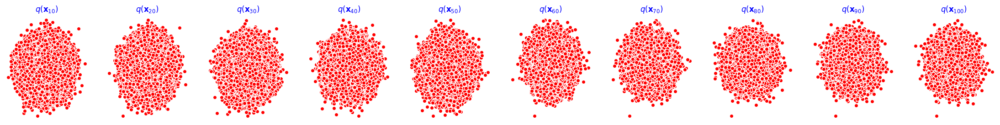

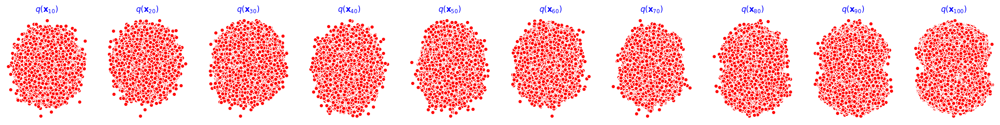

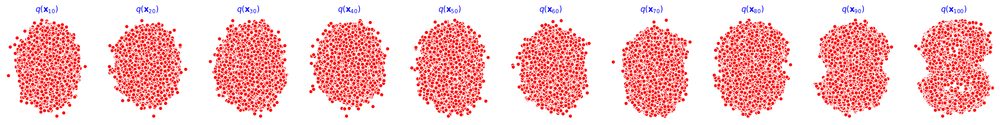

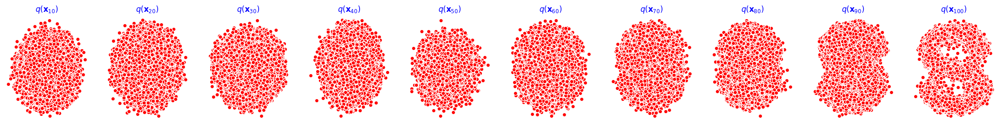

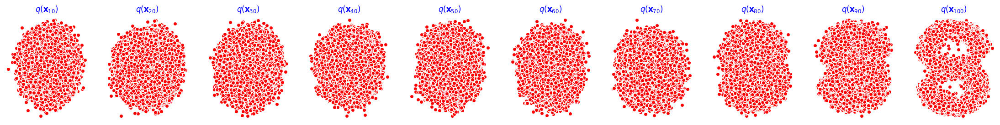

...

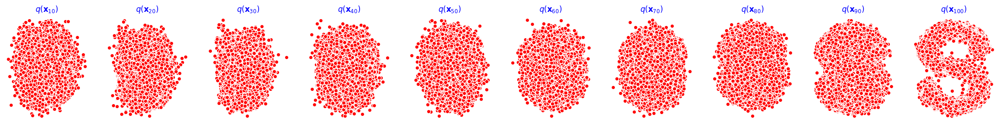

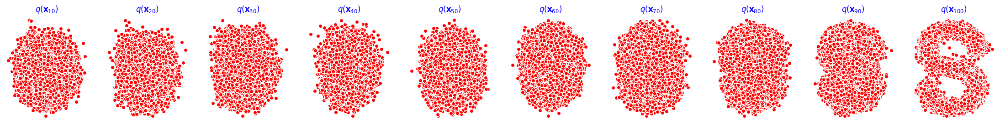

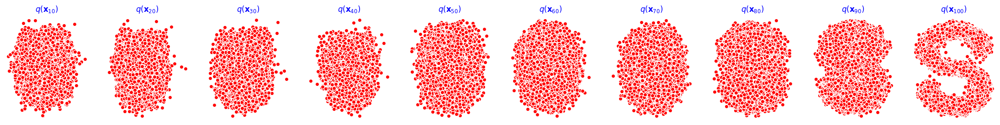

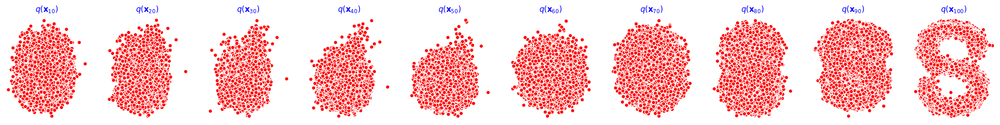

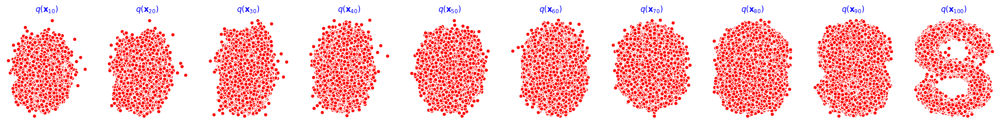

In [12]:
seed = 1234
    
print('Training model...')
batch_size = 128
dataloader = torch.utils.data.DataLoader(dataset,batch_size=batch_size,shuffle=True)
num_epoch = 4000
plt.rc('text',color='blue')

model = MLPDiffusion(num_steps) 
optimizer = torch.optim.Adam(model.parameters(),lr=1e-3)

for t in range(num_epoch):
    for idx,batch_x in enumerate(dataloader):
        loss = diffusion_loss_fn(model,batch_x,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,num_steps)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(),1.)
        optimizer.step()
        
    if(t%100==0):
        print(loss)
        x_seq = p_sample_loop(model,dataset.shape,num_steps,betas,one_minus_alphas_bar_sqrt)
        
        fig,axs = plt.subplots(1,10,figsize=(28,3))
        for i in range(1,11):
            cur_x = x_seq[i*10].detach()
            axs[i-1].scatter(cur_x[:,0],cur_x[:,1],color='red',edgecolor='white');
            axs[i-1].set_axis_off();
            axs[i-1].set_title('$q(\mathbf{x}_{'+str(i*10)+'})$')

9. Animation demonstrating the diffusion process and counter-diffusion process

In [ ]:
import io
from PIL import Image

imgs = []
for i in range(100):
    plt.clf()
    q_i = q_x(dataset,torch.tensor([i]))
    plt.scatter(q_i[:,0],q_i[:,1],color='red',edgecolor='white',s=5);
    plt.axis('off');
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf,format='png')
    img = Image.open(img_buf)
    imgs.append(img)

In [ ]:
reverse = []
for i in range(100):
    plt.clf()
    cur_x = x_seq[i].detach()
    plt.scatter(cur_x[:,0],cur_x[:,1],color='red',edgecolor='white',s=5);
    plt.axis('off')
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf,format='png')
    img = Image.open(img_buf)
    reverse.append(img)

In [ ]:
imgs = imgs +reverse

imgs[0].save("./out/diffusion.gif",format='GIF',append_images=imgs,save_all=True,duration=100,loop=0)

##### The diffusion process and counter-diffusion process：

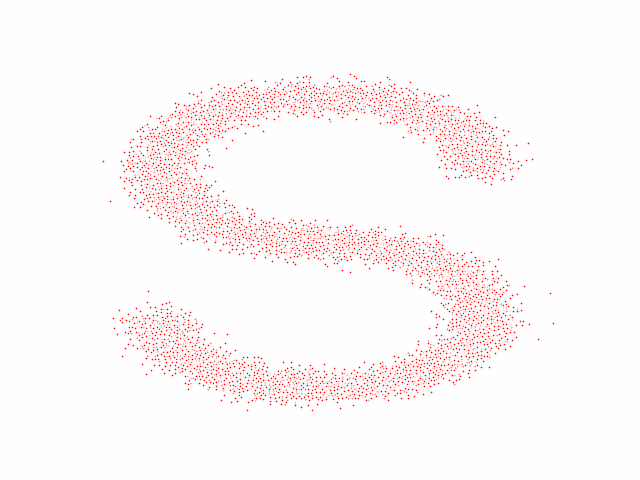

#### 2. Implement and verify the diffusion model training process step by step


1. we will use a very small classic data set MNIST to verify the training effect of the diffusion model

In [13]:
import torch
import torchvision
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from diffusers import DDPMScheduler, UNet2DModel
from matplotlib import pyplot as plt

# Set device
device = (
    "mps"
    if torch.backends.mps.is_available()
    else "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

print(f'Using device: {device}')


Using device: mps


100%|██████████| 9912422/9912422 [00:00<00:00, 15691162.17it/s]


Extracting mnist/MNIST/raw/train-images-idx3-ubyte.gz to mnist/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 644633.68it/s]


Extracting mnist/MNIST/raw/train-labels-idx1-ubyte.gz to mnist/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 4306162.90it/s]


Extracting mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 3601234.17it/s]

Extracting mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist/MNIST/raw

Input shape: torch.Size([8, 1, 28, 28])
Labels: tensor([4, 7, 0, 9, 5, 4, 9, 4])


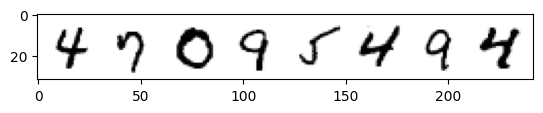

In [14]:
dataset = torchvision.datasets.MNIST(root="mnist/", train=True, download=True, transform=torchvision.transforms.ToTensor())
train_dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

x, y = next(iter(train_dataloader))
print('Input shape:', x.shape)
print('Labels:', y)
plt.imshow(torchvision.utils.make_grid(x)[0], cmap='Greys')

2. Diffusion model: degradation process 扩散模型：退化过程

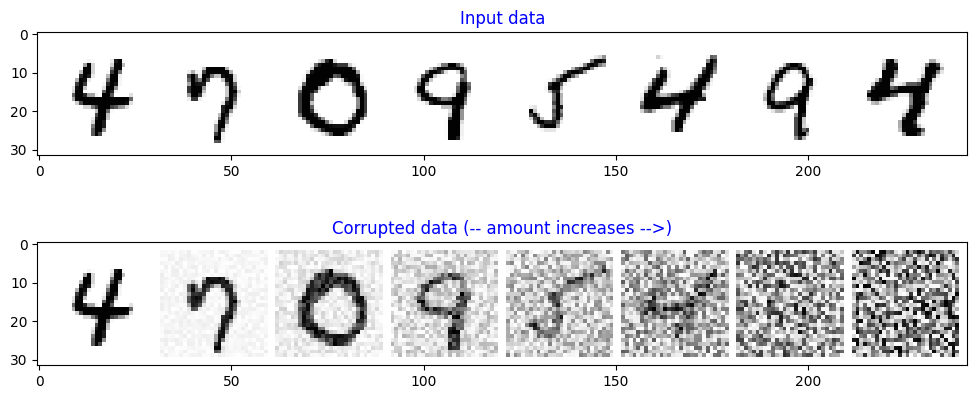

In [15]:
def corrupt(x, amount):
  """Corrupt the input `x` by mixing it with noise according to `amount`"""
  noise = torch.rand_like(x)
  amount = amount.view(-1, 1, 1, 1) # Sort shape so broadcasting works
  return x*(1-amount) + noise*amount 

# Plotting the input data
fig, axs = plt.subplots(2, 1, figsize=(12, 5))
axs[0].set_title('Input data')
axs[0].imshow(torchvision.utils.make_grid(x)[0], cmap='Greys')

# Adding noise
amount = torch.linspace(0, 1, x.shape[0]) # Left to right -> more corruption
noised_x = corrupt(x, amount)

# Plottinf the noised version
axs[1].set_title('Corrupted data (-- amount increases -->)')
axs[1].imshow(torchvision.utils.make_grid(noised_x)[0], cmap='Greys');

3. Diffusion Model: Training Process

UNET network 

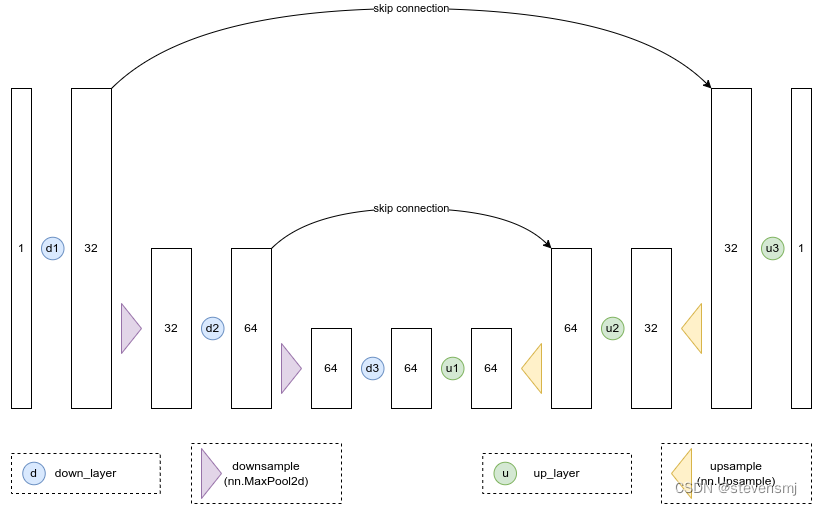


In [16]:
class BasicUNet(nn.Module):
    """A minimal UNet implementation."""
    def __init__(self, in_channels=1, out_channels=1):
        super().__init__()
        self.down_layers = torch.nn.ModuleList([ 
            nn.Conv2d(in_channels, 32, kernel_size=5, padding=2),
            nn.Conv2d(32, 64, kernel_size=5, padding=2),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
        ])
        self.up_layers = torch.nn.ModuleList([
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.Conv2d(64, 32, kernel_size=5, padding=2),
            nn.Conv2d(32, out_channels, kernel_size=5, padding=2), 
        ])
        self.act = nn.SiLU() # The activation function
        self.downscale = nn.MaxPool2d(2)
        self.upscale = nn.Upsample(scale_factor=2)

    def forward(self, x):
        h = []
        for i, l in enumerate(self.down_layers):
            x = self.act(l(x)) # Through the layer and the activation function
            if i < 2: # For all but the third (final) down layer:
              h.append(x) # Storing output for skip connection
              x = self.downscale(x) # Downscale ready for the next layer
              
        for i, l in enumerate(self.up_layers):
            if i > 0: # For all except the first up layer
              x = self.upscale(x) # Upscale
              x += h.pop() # Fetching stored output (skip connection)
            x = self.act(l(x)) # Through the layer and the activation function
            
        return x

Finished epoch 0. Average loss for this epoch: 0.025450
Finished epoch 1. Average loss for this epoch: 0.019837
Finished epoch 2. Average loss for this epoch: 0.018262
Finished epoch 3. Average loss for this epoch: 0.017414


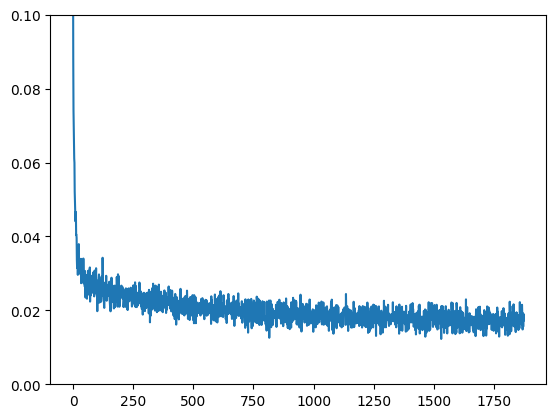

In [17]:
net = BasicUNet()
x = torch.rand(8, 1, 28, 28)

net(x).shape
sum([p.numel() for p in net.parameters()])

# Dataloader 
batch_size = 128
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

n_epochs = 4

# Create the network
net = BasicUNet()
net.to(device)

# Our loss finction
loss_fn = nn.MSELoss()

# The optimizer
opt = torch.optim.Adam(net.parameters(), lr=1e-3) 

# Keeping a record of the losses for later viewing
losses = []

# The training loop
for epoch in range(n_epochs):

    for x, y in train_dataloader:

        # Get some data and prepare the corrupted version
        x = x.to(device) # Data on the GPU
        noise_amount = torch.rand(x.shape[0]).to(device) # Pick random noise amounts
        noisy_x = corrupt(x, noise_amount) # Create our noisy x

        # Get the model prediction
        pred = net(noisy_x)

        # Calculate the loss
        loss = loss_fn(pred, x) 

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print our the average of the loss values for this epoch:
    avg_loss = sum(losses[-len(train_dataloader):])/len(train_dataloader)
    print(f'Finished epoch {epoch}. Average loss for this epoch: {avg_loss:05f}')

# View the loss curve
plt.plot(losses)
plt.ylim(0, 0.1);


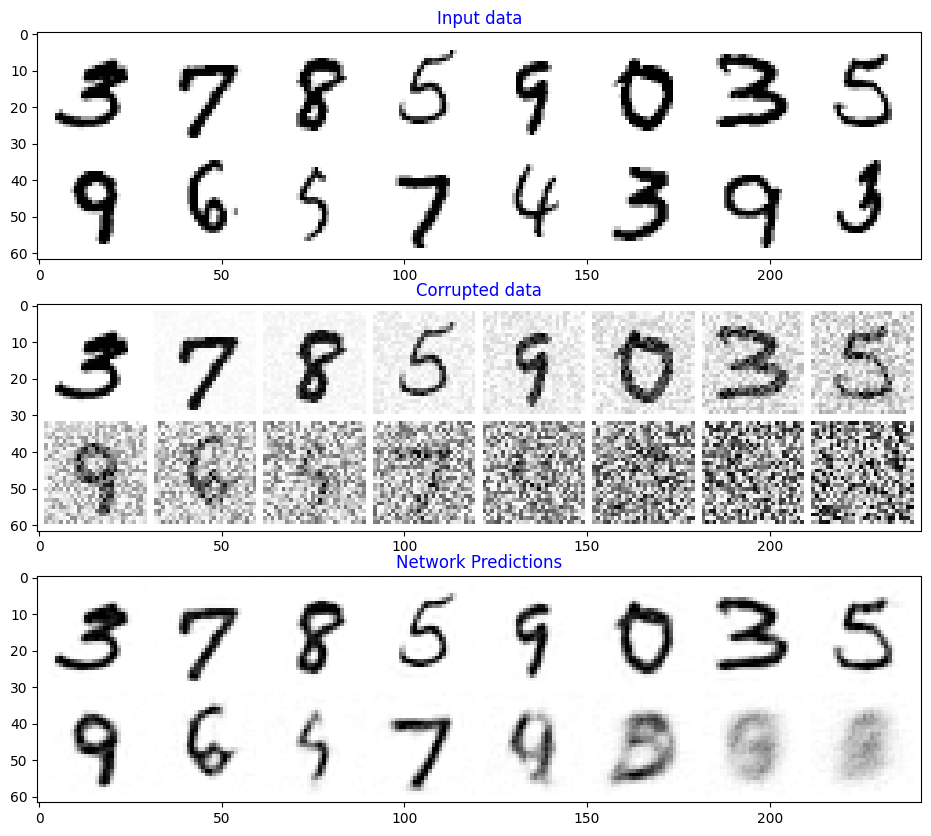

In [18]:
# Fetch some data
x, y = next(iter(train_dataloader))
x = x[:16] # Only using the first 16 for easy plotting

# Corrupt with a range of amounts
amount = torch.linspace(0, 1, x.shape[0]) # Left to right -> more corruption
noised_x = corrupt(x, amount)

# Get the model predictions
with torch.no_grad():
  preds = net(noised_x.to(device)).detach().cpu()

# Plot
fig, axs = plt.subplots(3, 1, figsize=(12, 10))
axs[0].set_title('Input data')
axs[0].imshow(torchvision.utils.make_grid(x)[0].clip(0, 1), cmap='Greys')
axs[1].set_title('Corrupted data')
axs[1].imshow(torchvision.utils.make_grid(noised_x)[0].clip(0, 1), cmap='Greys')
axs[2].set_title('Network Predictions')
axs[2].imshow(torchvision.utils.make_grid(preds)[0].clip(0, 1), cmap='Greys');

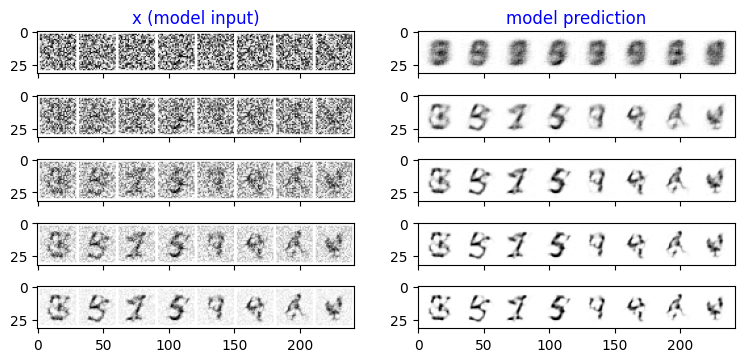

In [19]:
n_steps = 5
x = torch.rand(8, 1, 28, 28).to(device) # Start from random
step_history = [x.detach().cpu()]
pred_output_history = []

for i in range(n_steps):
    with torch.no_grad(): 
        pred = net(x) 
    pred_output_history.append(pred.detach().cpu()) # Store model output for plotting
    mix_factor = 1/(n_steps - i) 
    x = x*(1-mix_factor) + pred*mix_factor # Move part of the way there
    step_history.append(x.detach().cpu()) # Store step for plotting

fig, axs = plt.subplots(n_steps, 2, figsize=(9, 4), sharex=True)
axs[0,0].set_title('x (model input)')
axs[0,1].set_title('model prediction')
for i in range(n_steps):
    axs[i, 0].imshow(torchvision.utils.make_grid(step_history[i])[0].clip(0, 1), cmap='Greys')
    axs[i, 1].imshow(torchvision.utils.make_grid(pred_output_history[i])[0].clip(0, 1), cmap='Greys')

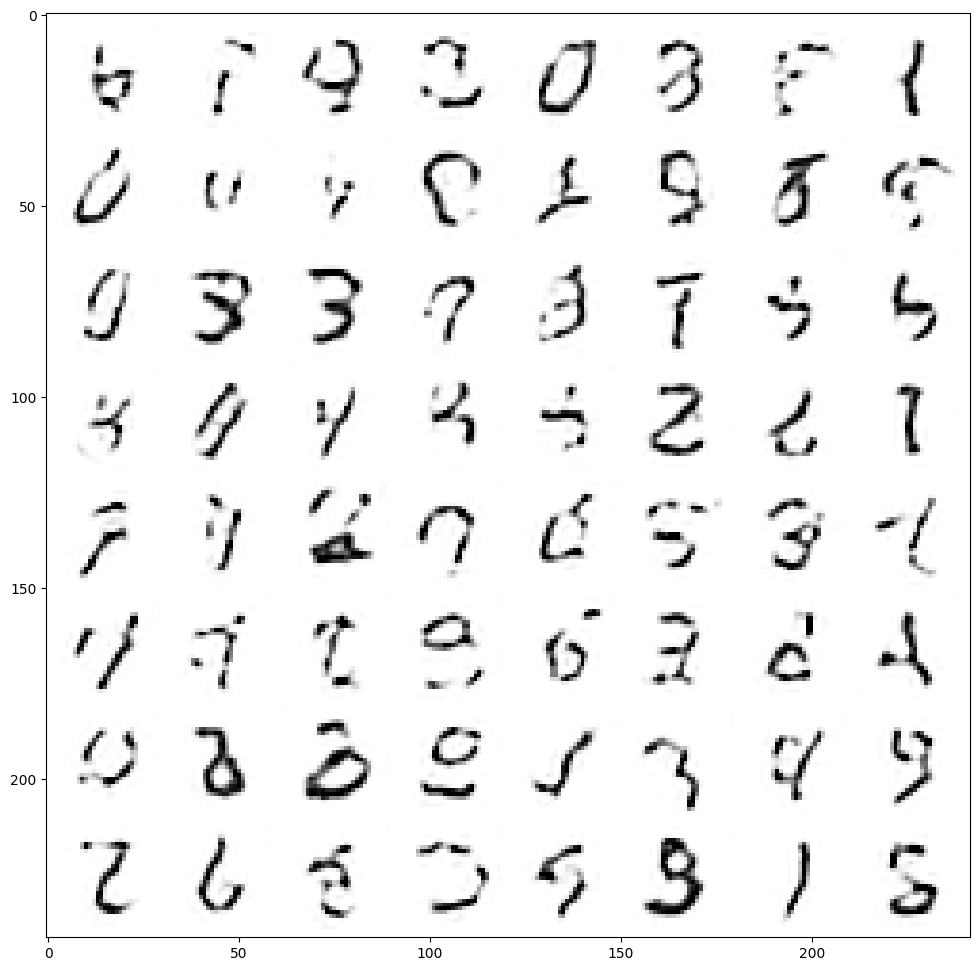

In [20]:
n_steps = 40
x = torch.rand(64, 1, 28, 28).to(device)
for i in range(n_steps):
  noise_amount = torch.ones((x.shape[0], )).to(device) * (1-(i/n_steps))
  with torch.no_grad():
    pred = net(x)
  mix_factor = 1/(n_steps - i)
  x = x*(1-mix_factor) + pred*mix_factor
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax.imshow(torchvision.utils.make_grid(x.detach().cpu(), nrow=8)[0].clip(0, 1), cmap='Greys')

[Summary]: As shown in the figure above, for inputs with low amounts of noise, the model's predictions are quite good. However, for inputs with a high amount of noise, the information the model is able to obtain starts to decrease. When amount = 1, the model will output a vague prediction that is very close to the mean of the data set.

##### Use UNet2DModel from the Diffusers library

The UNet2DModel model in the Diffusers library has the following improvements compared to the BasicUNet model used previously:
1. The GroupNorm layer performs group normalization on the input of each module.
2. Dropout layer can make training smoother.
3. Multiple ResNet layers per block (if layers_per_block is not set to 1).
4. Introducing the attention mechanism


In [5]:
model = UNet2DModel(
    sample_size=28,           # the target image resolution
    in_channels=1,            # the number of input channels, 3 for RGB images
    out_channels=1,           # the number of output channels
    layers_per_block=2,       # how many ResNet layers to use per UNet block
    block_out_channels=(32, 64, 64), # Roughly matching our basic unet example
    down_block_types=( 
        "DownBlock2D",        # a regular ResNet downsampling block
        "AttnDownBlock2D",    # a ResNet downsampling block with spatial self-attention
        "AttnDownBlock2D",
    ), 
    up_block_types=(
        "AttnUpBlock2D", 
        "AttnUpBlock2D",      # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",          # a regular ResNet upsampling block
      ),
)

model

UNet2DModel(
  (conv_in): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): LoRACompatibleLinear(in_features=32, out_features=128, bias=True)
    (act): SiLU()
    (linear_2): LoRACompatibleLinear(in_features=128, out_features=128, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 32, eps=1e-05, affine=True)
          (conv1): LoRACompatibleConv(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): LoRACompatibleLinear(in_features=128, out_features=32, bias=True)
          (norm2): GroupNorm(32, 32, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): LoRACompatibleConv(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleLis

In [6]:
# 1.7M parameters of the UNet2DModel vs the ~309k parameters of the BasicUNet
sum([p.numel() for p in model.parameters()])

1707009

Finished epoch 0. Average loss for this epoch: 0.019511
Finished epoch 1. Average loss for this epoch: 0.013019
Finished epoch 2. Average loss for this epoch: 0.011907
Finished epoch 3. Average loss for this epoch: 0.011142
Finished epoch 4. Average loss for this epoch: 0.010760
Finished epoch 5. Average loss for this epoch: 0.010561
Finished epoch 6. Average loss for this epoch: 0.010273
Finished epoch 7. Average loss for this epoch: 0.010236
Finished epoch 8. Average loss for this epoch: 0.010004
Finished epoch 9. Average loss for this epoch: 0.009865
Finished epoch 10. Average loss for this epoch: 0.009822
Finished epoch 11. Average loss for this epoch: 0.009667
Finished epoch 12. Average loss for this epoch: 0.009650
Finished epoch 13. Average loss for this epoch: 0.009555
Finished epoch 14. Average loss for this epoch: 0.009560
Finished epoch 15. Average loss for this epoch: 0.009403
Finished epoch 16. Average loss for this epoch: 0.009274
Finished epoch 17. Average loss for this 

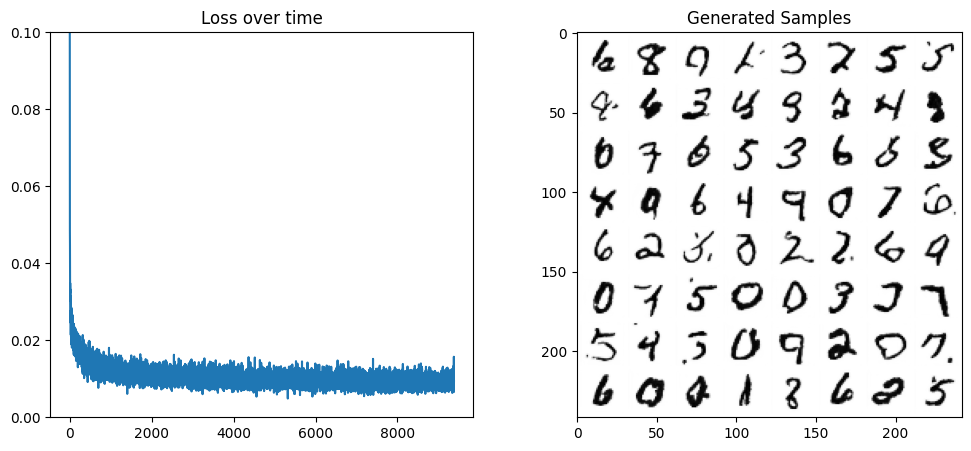

In [7]:
# Dataloader 
batch_size = 128
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

n_epochs = 20

# Create the network
net = UNet2DModel(
    sample_size=28,  # the target image resolution
    in_channels=1,   # the number of input channels, 3 for RGB images
    out_channels=1,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(32, 64, 64),  # Roughly matching our basic unet example
    down_block_types=( 
        "DownBlock2D",  # a regular ResNet downsampling block
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "AttnDownBlock2D",
    ), 
    up_block_types=(
        "AttnUpBlock2D", 
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",   # a regular ResNet upsampling block
      ),
) 
net.to(device)

# Our loss finction
loss_fn = nn.MSELoss()

# The optimizer
opt = torch.optim.Adam(net.parameters(), lr=1e-3) 

# Keeping a record of the losses for later viewing
losses = []

for epoch in range(n_epochs):

    for x, y in train_dataloader:

        # Get some data and prepare the corrupted version
        x = x.to(device) # Data on the GPU
        noise_amount = torch.rand(x.shape[0]).to(device) # Pick random noise amounts
        noisy_x = corrupt(x, noise_amount) # Create our noisy x

        # Get the model prediction
        pred = net(noisy_x, 0).sample # Using timestep 0 always, adding .sample

        # Calculate the loss
        loss = loss_fn(pred, x) # How close is the output to the true 'clean' x?

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print our the average of the loss values for this epoch:
    avg_loss = sum(losses[-len(train_dataloader):])/len(train_dataloader)
    print(f'Finished epoch {epoch}. Average loss for this epoch: {avg_loss:05f}')

# Plot losses and some samples
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Losses
axs[0].plot(losses)
axs[0].set_ylim(0, 0.1)
axs[0].set_title('Loss over time')

# Samples
n_steps = 40
x = torch.rand(64, 1, 28, 28).to(device)
for i in range(n_steps):
  noise_amount = torch.ones((x.shape[0], )).to(device) * (1-(i/n_steps)) # Starting high going low
  with torch.no_grad():
    pred = net(x, 0).sample
  mix_factor = 1/(n_steps - i)
  x = x*(1-mix_factor) + pred*mix_factor

axs[1].imshow(torchvision.utils.make_grid(x.detach().cpu(), nrow=8)[0].clip(0, 1), cmap='Greys')
axs[1].set_title('Generated Samples');

Summary: Judging from the images and loss curves of the generated samples, this model is much better than the basic model.

Note: The difference between VAE and Diffusion

**VAE** is essentially a gradient-based encoder-decoder architecture. The encoder is used to learn the mean and variance of Gaussian distribution. The decoder uses variational posteriors to learn generation capabilities. The mapping of standard Gaussian to data samples is self-defined. 

**Diffusion** is essentially an SDE/Markov architecture. Although it also draws on the forward propagation/back propagation concepts of neural networks, it is not based on differentiable gradients.

Both define Gaussian distribution as latent variables, but VAE will serve as a priori condition (variational prior), while diffusion will serve as a stationary distribution similar to a Markov chain with variational posterior.

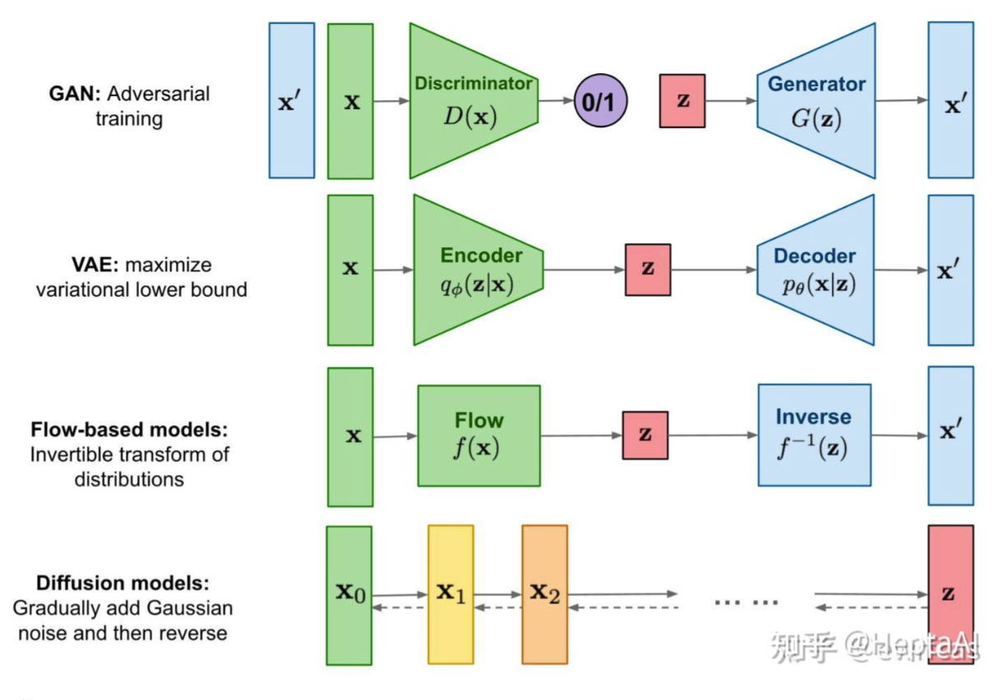

image source：https://zhuanlan.zhihu.com/p/525106459
